In [1]:
%pip install transformers accelerate
%pip install matplotlib
%pip install pytorch-msssim torchvision


Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import torch
import torchvision.transforms as T
import torch.nn as nn
from torchvision.utils import save_image
from PIL import Image
import matplotlib.pyplot as plt
from pytorch_msssim import ssim, ms_ssim
from torchvision import models

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")


Using device: cuda


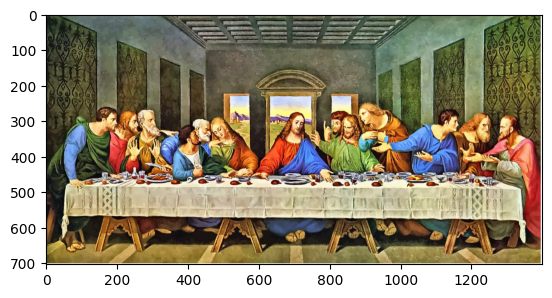

In [3]:
reference_image = Image.open("lastsummer.webp")
plt.imshow(reference_image)
ref_width = reference_image.width
ref_height = reference_image.height

In [4]:
transform = T.Compose([T.ToTensor()])
reference_tensor = transform(reference_image).unsqueeze(0).to(device)
print (reference_tensor.shape)


torch.Size([1, 3, 704, 1400])


In [5]:
class VGGPerceptualLoss(nn.Module):
    def __init__(self, conv_index='22'):
        super(VGGPerceptualLoss, self).__init__()
        vgg = models.vgg19(pretrained=True).features
        self.slice = nn.Sequential()
        for x in range(int(conv_index)):
            self.slice.add_module(str(x), vgg[x])
        self.slice.eval()
        for param in self.slice.parameters():
            param.requires_grad = False

    def forward(self, input, target):
        input_features = self.slice(input)
        target_features = self.slice(target)
        return nn.functional.mse_loss(input_features, target_features)

perceptual_loss = VGGPerceptualLoss().to(device)


/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [22]:
# Initialize canvas and circles
num_circles = 5
circles_rand = torch.zeros(num_circles, 8, device=device)  # x, y, cxx, cxy, cyy, r,g,b
circles_rand[:,0:2] = torch.rand(num_circles, 2, device=device)  # x, y, radius, r,g,b
circles_rand[:, 1] *= ref_height / ref_width
circles_rand[:,2:8] = torch.rand(num_circles, 6, device=device) * 2 - 1 # x, y, radius, r,g,b

circles = nn.Parameter(circles_rand.clone(), requires_grad=True)

mean_color = reference_tensor.mean(dim=[2,3]).squeeze()
background_color = nn.Parameter(mean_color.clone(), requires_grad=True)

# Optimization
optimizer = torch.optim.Adam([{'params':circles, 'lr':0.01}, {'params':background_color, 'lr':0.01}])
loss_fn = torch.nn.MSELoss()

def smooth_step(x, edge0, edge1):
    x = torch.clamp((x - edge0) / (edge1 - edge0), 0.0, 1.0)
    return x * x * (3 - 2 * x)

def render_smooth_circles(circles:torch.Tensor, background_color, height, width):
    canvas = background_color.unsqueeze(1).unsqueeze(1).repeat(1,1, height, width)
    yy, xx = torch.meshgrid(torch.arange(height, device=circles.device), 
                            torch.arange(width, device=circles.device), 
                            indexing='ij')
    xx = xx.float() / width
    yy = yy.float() / width

    for x, y, cxx, cxy, cyy, r,g,b in circles:
        x = x % 1.0
        y = y % (height / width)
        r,g,b = torch.sigmoid(torch.stack([r,g,b]))
        s = torch.sigmoid(torch.stack([cxx,cyy]))
        r = torch.tanh(cxy) * 2 - 1
        cov_matrix = torch.stack([
            torch.stack([s[0], r * torch.sqrt(s[0] * s[1])]),
            torch.stack([r * torch.sqrt(s[0] * s[1]), s[1]])
        ])
        cov_matrix = cov_matrix * 0.1 + torch.eye(2, device=circles.device) * 1e-5
        diff = torch.stack([xx - x, yy - y], dim=0)
        inv_cov = torch.inverse(cov_matrix)
        mahalanobis = torch.sum((diff.permute(1, 2, 0) @ inv_cov) * diff.permute(1, 2, 0), dim=-1)
        gauss = torch.exp(-0.5 * mahalanobis)
        rgb = torch.stack([r,g,b]).unsqueeze(1).unsqueeze(1).repeat(1, height, width)
        print (rgb.shape)
        print (gauss.shape)
        print (canvas.shape)
        canvas = canvas * (1 - gauss) + rgb * gauss

    return canvas

alpha = 0.84
beta = 0.16
gamma = 80.0
losses = []

# Use this function in your optimization loop
for epoch in range(100000):
    optimizer.zero_grad()
    canvas = render_smooth_circles(circles,background_color, ref_height, ref_width)
    ssim_loss = 1 - ssim(canvas.unsqueeze(0), reference_tensor.unsqueeze(0), data_range=1.0)
    canvas_reshaped = canvas.squeeze(1)
    reference_reshaped = reference_tensor.squeeze(1)

    perc_loss = perceptual_loss(canvas_reshaped, reference_reshaped)
    color_loss = nn.functional.mse_loss(canvas, reference_tensor)
    loss = alpha * ssim_loss + beta * perc_loss + gamma * color_loss
    loss.backward()
    optimizer.step()
    losses.append(loss.item())
    plt.plot(losses)
    if epoch % 100 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item()}")
        save_image(canvas.clamp(0, 1), f"output_{epoch}.png")


torch.Size([3, 704, 1400])
torch.Size([704, 1400])
torch.Size([1, 3, 704, 1400])
torch.Size([3, 704, 1400])
torch.Size([704, 1400])
torch.Size([1, 3, 704, 1400])
torch.Size([3, 704, 1400])
torch.Size([704, 1400])
torch.Size([1, 3, 704, 1400])
torch.Size([3, 704, 1400])
torch.Size([704, 1400])
torch.Size([1, 3, 704, 1400])
torch.Size([3, 704, 1400])
torch.Size([704, 1400])
torch.Size([1, 3, 704, 1400])


/opt/conda/lib/python3.10/site-packages/pytorch_msssim/ssim.py:50: UserWarning: Skipping Gaussian Smoothing at dimension 2+0 for input: torch.Size([1, 1, 3, 704, 1400]) and win size: 11
  warnings.warn(


Epoch 0, Loss: 74369208.0
torch.Size([3, 704, 1400])
torch.Size([704, 1400])
torch.Size([1, 3, 704, 1400])
torch.Size([3, 704, 1400])
torch.Size([704, 1400])
torch.Size([1, 3, 704, 1400])
torch.Size([3, 704, 1400])
torch.Size([704, 1400])
torch.Size([1, 3, 704, 1400])
torch.Size([3, 704, 1400])
torch.Size([704, 1400])
torch.Size([1, 3, 704, 1400])
torch.Size([3, 704, 1400])
torch.Size([704, 1400])
torch.Size([1, 3, 704, 1400])
torch.Size([3, 704, 1400])
torch.Size([704, 1400])
torch.Size([1, 3, 704, 1400])
torch.Size([3, 704, 1400])
torch.Size([704, 1400])
torch.Size([1, 3, 704, 1400])
torch.Size([3, 704, 1400])
torch.Size([704, 1400])
torch.Size([1, 3, 704, 1400])
torch.Size([3, 704, 1400])
torch.Size([704, 1400])
torch.Size([1, 3, 704, 1400])
torch.Size([3, 704, 1400])
torch.Size([704, 1400])
torch.Size([1, 3, 704, 1400])
torch.Size([3, 704, 1400])
torch.Size([704, 1400])
torch.Size([1, 3, 704, 1400])
torch.Size([3, 704, 1400])
torch.Size([704, 1400])
torch.Size([1, 3, 704, 1400])
to

_LinAlgError: linalg.inv: The diagonal element 2 is zero, the inversion could not be completed because the input matrix is singular.

: 

In [64]:
c = torch.ones(1, 3,5, 10, device=circles.device)
torch.tensor([7,8,9], device=circles.device).unsqueeze(1).unsqueeze(1).repeat(1, 1, 5, 10)

tensor([[[[7, 7, 7, 7, 7, 7, 7, 7, 7, 7],
          [7, 7, 7, 7, 7, 7, 7, 7, 7, 7],
          [7, 7, 7, 7, 7, 7, 7, 7, 7, 7],
          [7, 7, 7, 7, 7, 7, 7, 7, 7, 7],
          [7, 7, 7, 7, 7, 7, 7, 7, 7, 7]],

         [[8, 8, 8, 8, 8, 8, 8, 8, 8, 8],
          [8, 8, 8, 8, 8, 8, 8, 8, 8, 8],
          [8, 8, 8, 8, 8, 8, 8, 8, 8, 8],
          [8, 8, 8, 8, 8, 8, 8, 8, 8, 8],
          [8, 8, 8, 8, 8, 8, 8, 8, 8, 8]],

         [[9, 9, 9, 9, 9, 9, 9, 9, 9, 9],
          [9, 9, 9, 9, 9, 9, 9, 9, 9, 9],
          [9, 9, 9, 9, 9, 9, 9, 9, 9, 9],
          [9, 9, 9, 9, 9, 9, 9, 9, 9, 9],
          [9, 9, 9, 9, 9, 9, 9, 9, 9, 9]]]], device='cuda:0')

In [71]:
1.0 - torch.tensor([7,8,9], device=circles.device)

tensor([-6., -7., -8.], device='cuda:0')